# **East Africa drought study - plots**
All figures not produced in this notebook are output either from R or from the climate explorer

In [2]:
import sys; sys.path.append('/home/clair/wwa')
from wwa import *
from wwa_nonstationary_fitting import *

# load shapefile used to extract time series from gridded data
sf = gpd.read_file("sf_gha")

import json     # for loading lists produced in R

import lmoments3.distr                     # for SPEI calibration: install using `pip install git+https://github.com/OpenHydrology/lmoments3.git`
glo = getattr(lmoments3.distr, "glo") 

---
## **Figure for web summary**

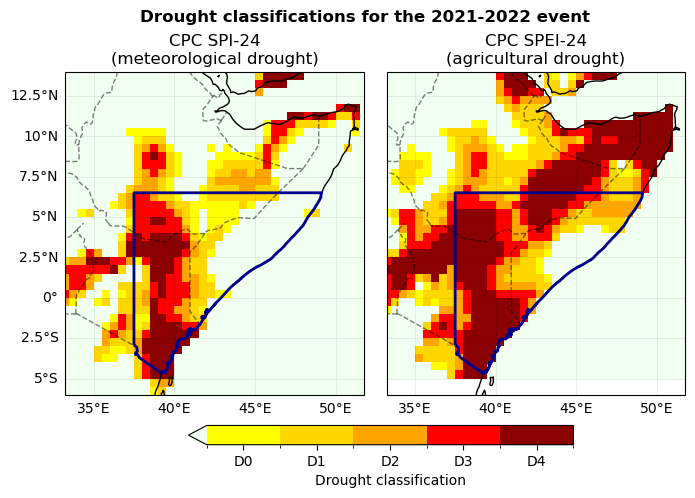

In [9]:
spi = xr.open_dataset("data/cpc_spi-24.nc").isel(time = -1).spi
spei = xr.open_dataset("data/cpc_spei-24.nc").isel(time = -1).spei

fig, axs = plt.subplots(ncols = 2, figsize = (8,5), subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (33.25,51.75,-6,14)})
plt.subplots_adjust(wspace = 0.075)

cbar = drought_map(spi, ax = axs[0]); axs[0].set_title("CPC SPI-24\n(meteorological drought)")
cbar = drought_map(spei, ax = axs[1]); axs[1].set_title("CPC SPEI-24\n(agricultural drought)")

    
for ax in axs:
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkblue", lw = 2)    
    ax.add_feature(cartopy.feature.BORDERS, ls = "--", alpha = 0.5)
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom"], alpha=0.1, xlocs = range(35,55,5))

drought_colorbar(cbar, axs, fraction = 0.05, pad = 0.08, label = "Drought classification")
axs[0].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["left"], alpha=0)
plt.suptitle("Drought classifications for the 2021-2022 event", fontweight = "bold")

plt.savefig("fig/ws_event-map_cpc-drought-severity.png")

---
## **Plots included in scientific report**

### **Figure 1. Drought classifications**

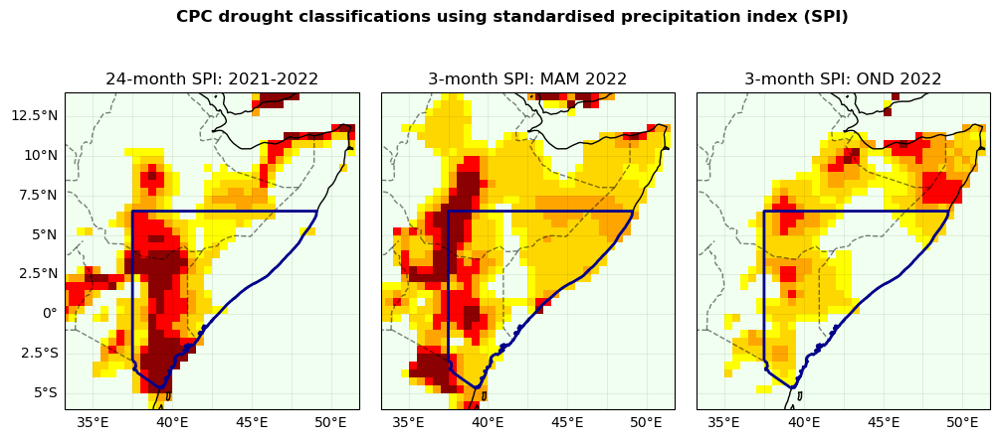

In [2]:
spi = [xr.open_dataset("data/cpc_spi-"+seas+".nc").isel(time = -1).spi for seas in ["24", "mam", "ond"]]

fig, axs = plt.subplots(ncols = 3, figsize = (12,5), subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (33.25,51.75,-6,14)})
plt.subplots_adjust(wspace = 0.075)

for i in range(3):
    
    ax = axs[i]
    cbar = drought_map(spi[i], ax = axs[i])
    
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkblue", lw = 2)    
    ax.add_feature(cartopy.feature.BORDERS, ls = "--", alpha = 0.5)
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom"], alpha=0.1)
    
axs[0].set_title("24-month SPI: 2021-2022")
axs[1].set_title("3-month SPI: MAM 2022")
axs[2].set_title("3-month SPI: OND 2022")

# drought_colorbar(cbar, axs, fraction = 0.05, pad = 0.08, label = "Drought classification")
axs[0].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["left"], alpha=0)

plt.suptitle("CPC drought classifications using standardised precipitation index (SPI)", fontweight = "bold")
plt.savefig("fig/fig1_event-map_cpc-spi-drought-severity.png")

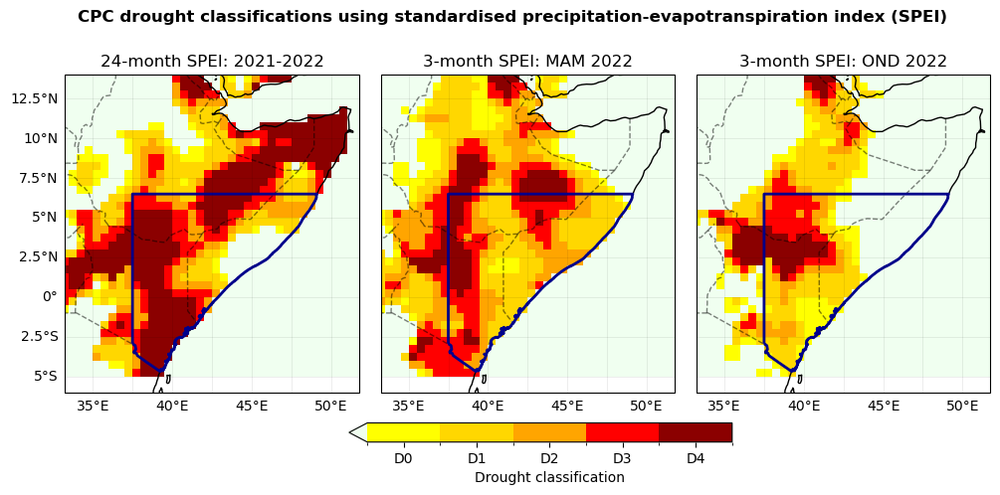

In [3]:
spei = [xr.open_dataset("data/cpc_spei-"+seas+".nc").isel(time = -1).spei for seas in ["24", "mam", "ond"]]

fig, axs = plt.subplots(ncols = 3, figsize = (12,5), subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (33.25,51.75,-6,14)})
plt.subplots_adjust(wspace = 0.075)

for i in range(3):
    
    ax = axs[i]
    cbar = drought_map(spei[i], ax = axs[i])
    
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkblue", lw = 2)    
    ax.add_feature(cartopy.feature.BORDERS, ls = "--", alpha = 0.5)
    ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom"], alpha=0.1)
    
axs[0].set_title("24-month SPEI: 2021-2022")
axs[1].set_title("3-month SPEI: MAM 2022")
axs[2].set_title("3-month SPEI: OND 2022")

drought_colorbar(cbar, axs, fraction = 0.05, pad = 0.08, label = "Drought classification")
axs[0].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["left"], alpha=0)

plt.suptitle("CPC drought classifications using standardised precipitation-evapotranspiration index (SPEI)", fontweight = "bold")
plt.savefig("fig/fig1_event-map_cpc-spei-drought-severity.png")

### **Figure 3. PR-PET-SPEI contours**

In [9]:
# dummy plot just to pick up the colourbar
drought_cbar = drought_map(xr.open_dataset("data/cpc_spei24.nc").spei.sel(time = "2022")); plt.close()

In [10]:
# load copula meshes (computed in R)
with open("mv/joint-fit_pr-24_pet-24_cpc.json") as f:
    coef, rl_pr, rl_pet, contour_now, contour_cf = json.load(f).values()
    
    
# load precip & PET, calculate effective precip; use this to compute SPEI over regular grid of pr & pet
df = pd.merge(load_ts("ts/EA-drought_pr-24_cpc.dat", names = ["year", "pr"], index_col = 0),
              load_ts("ts/EA-drought_pet-24_cpc.dat", names = ["year", "pet"], index_col = 0),
              left_index = True, right_index = True)
df["effpr"] = df.pr - df.pet

# compute SPEI on regular grid
spei24_pars = glo.lmom_fit(df.loc[slice("1980", "2010"), "effpr"].copy()).values()
spei_grid = np.array([[norm.ppf(glo.cdf(p - pet, *spei24_pars)) for p in contour_now["x"]] for pet in contour_now["y"]])

/tmp/ipykernel_18441/2073179422.py:10: RuntimeWarning: divide by zero encountered in divide
  cs_hist = axs.contour(contour_cf["x"], contour_cf["y"], 1/np.array(contour_cf["z"]).transpose(), levels = yy, colors = "darkblue", linestyles = "--")


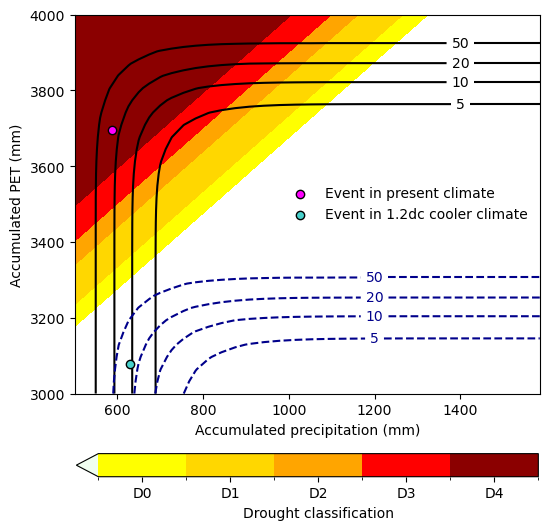

In [27]:
# plot the contours (some cleaning needed)
fig, axs = plt.subplots(ncols = 1, figsize = (6,6), dpi = 100)
yy = [5,10,20,50]

axs.contourf(contour_now["x"], contour_now["y"], spei_grid, levels = [-np.inf, -2, -1.55, -1.25, -.75, -.5], colors = ['darkred', 'red', 'orange', 'gold','yellow','honeydew'])

cs = axs.contour(contour_now["x"], contour_now["y"], 1/np.array(contour_now["z"]).transpose(), levels = yy, colors = "k")
plt.clabel(cs, levels = yy, manual = [(1400,4000), (1400,3900), (1400,3800), (1400,3500)])

cs_hist = axs.contour(contour_cf["x"], contour_cf["y"], 1/np.array(contour_cf["z"]).transpose(), levels = yy, colors = "darkblue", linestyles = "--")
plt.clabel(cs_hist, levels = yy, manual = [(1200,3300), (1200,3250), (1200,3200), (1200,3100)])

axs.scatter(rl_pr["2022"][0], rl_pet["2022"], marker = "o", color = "magenta", edgecolor = "k", zorder = 10, label = "Event in present climate")
axs.scatter(rl_pr["hist"][0], rl_pet["hist"], marker = "o", color = "mediumturquoise", edgecolor = "k", zorder = 10, label = "Event in 1.2dc cooler climate")

axs.set_xlabel("Accumulated precipitation (mm)")
axs.set_ylabel("Accumulated PET (mm)")

axs.legend(loc = "center right", edgecolor = "w")
drought_colorbar(drought_cbar, axs, fraction = 0.05, pad = 0.13, label = "Drought classification")

plt.savefig("fig/fig3_cpc-24month-joint-drought-classification-contours.png")

### **Figure A1. elevation map**
- Gridded elevation data downloaded from http://research.jisao.washington.edu/data_sets/elevation/

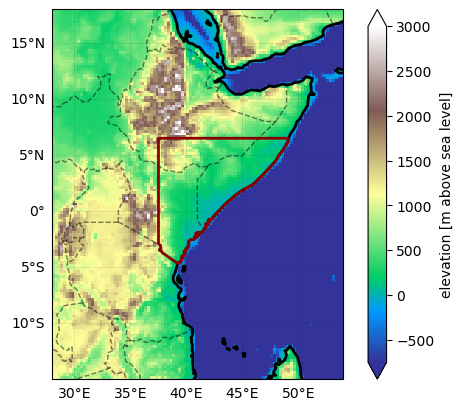

In [47]:
elev = xr.open_dataset("../90_data/tbase_elev-0.25deg.nc").elev.sel(lon = slice(28,54), lat = slice(-15,18))

elev.plot(cmap = "terrain", vmin = -750, vmax = 3000, subplot_kws = {"projection" : cartopy.crs.PlateCarree()})

ax = plt.gcf().axes[0]
ax.coastlines(lw = 2)
ax.add_feature(cartopy.feature.BORDERS, ls = "--", alpha = 0.5)
sf.boundary.plot(ax = ax, color = "darkred", lw = 2)
ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom", "left"], alpha=0.1)

plt.savefig("fig/figA1_elevation.png")

### **Figure A1. Koppen-Geiger regions**
- classification maps & legend downloaded from https://www.gloh2o.org/koppen/

In [34]:
# convert tiff to netcdf for easier plotting
from PIL import Image

kg = np.flip(np.array(Image.open('../../Data/koppen-geiger/Beck_KG_V1_present_0p083.tif')),0)
kg_arr = xr.DataArray(kg, name = "kg_cat", dims = ["lat", "lon"], coords = {"lat" : ("lat", np.linspace(-90,90, num = kg.shape[0])),
                                                                            "lon" : ("lon", np.linspace(-180,180, num = kg.shape[1]))})
kg_arr = kg_arr.sel(lon = slice(33,52), lat = slice(-5,15))

df = pd.read_fwf("../../Data/koppen-geiger/Beck_KG_legend.txt", widths = [8,5,38], skiprows = 3, nrows = 29, names = ["cat", "code", "desc"])
df["cat"] = [re.sub(":", "",n) for n in df.cat]
df = df.set_index("cat")

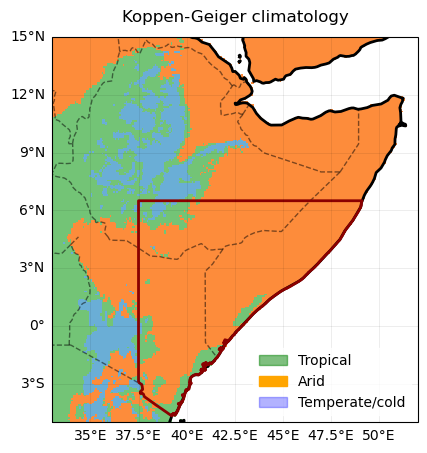

In [46]:
fig, ax = plt.subplots(dpi = 100, subplot_kw = {"projection" : cartopy.crs.PlateCarree()}, figsize = (6,5))
[kg_arr.where(kg_arr == r).plot(ax = ax, label = df.loc[str(r), "desc"], cmap = "Greens", add_colorbar = False) for r in range(1,4)]
[kg_arr.where(kg_arr == r).plot(ax = ax, label = df.loc[str(r), "desc"], cmap = "Oranges", add_colorbar = False) for r in range(4,8)]
[kg_arr.where(kg_arr == r).plot(ax = ax, label = df.loc[str(r), "desc"], cmap = "Blues", add_colorbar = False) for r in range(8,30)]

sf.boundary.plot(ax = ax, color = "darkred", lw = 2)
ax.coastlines(lw = 2)
ax.add_feature(cartopy.feature.BORDERS, ls = "--", alpha = 0.5)    
ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom", "left"], alpha=0.1)

plt.legend(handles = [matplotlib.patches.Patch(color = "green", label = "Tropical", alpha = 0.5), 
                      matplotlib.patches.Patch(color = "orange", label = "Arid", alpha = 1),
                      matplotlib.patches.Patch(color = "blue", label = "Temperate/cold", alpha = 0.3)], 
           edgecolor = "w", loc = "lower right")

plt.title("Koppen-Geiger climatology")
plt.savefig("fig/figA1_koppen-geiger-climatology.png")

### **Figure A2. Seasonal cycle per lat/lon**
_Using CHIRPS because CPC monthly currently not stored - however, seasonal cycles found to be almost identical during model validation_

In [4]:
# seasonal cycle at each latitude - use daily data for this

chirps_d = xr.open_dataset("data/chirps25_daily.nc").precip.assign_attrs(long_name = "Mean precip")

chirps_sc_by_lat = chirps_d.groupby_bins(group = "latitude", bins = range(-5,15)).mean().mean("longitude").groupby("time.dayofyear").mean()
chirps_sc_by_lon = chirps_d.groupby_bins(group = "longitude", bins = range(33,52)).mean().mean("latitude").groupby("time.dayofyear").mean()

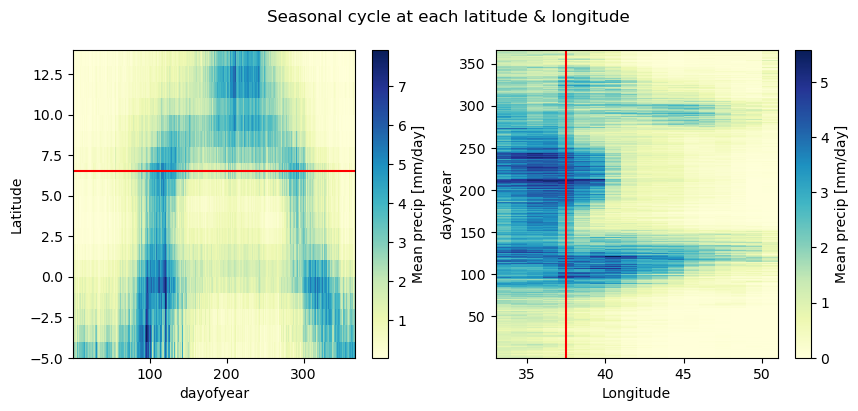

In [5]:
fig, axs = plt.subplots(ncols = 2, figsize = (10,4), dpi = 100)

chirps_sc_by_lat.transpose().plot(ax = axs[0], cmap = "YlGnBu") 
axs[0].set_ylabel("Latitude")
axs[0].axhline(6.5, color = "red")

chirps_sc_by_lon.plot(ax = axs[1], cmap = "YlGnBu") 
axs[1].set_xlabel("Longitude")
axs[1].axvline(37.5, color = "red")

plt.suptitle("Seasonal cycle at each latitude & longitude")
plt.savefig("fig/chirps_seasonal-cycle_latlon.png")

### **Figure A3. Station locations**

In [37]:
cpc_spei = xr.open_dataset("data/cpc_spei-24.nc").spei.sel(time = "2022")

In [38]:
stations = [re.sub(".csv", "", re.sub(".+_", "", fnm)) for fnm in glob.glob("data/stn_*.csv") if not "lodwar" in fnm and not "mtwapa" in fnm]
stations = {s : list(get_latlon(s).values()) for s in stations}

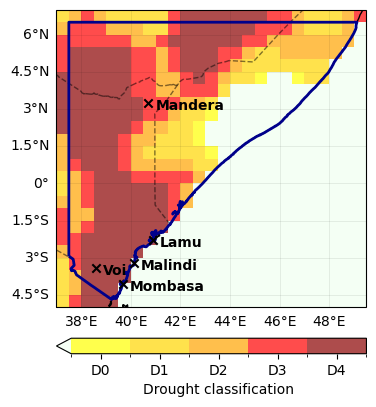

In [45]:
sf = gpd.read_file("sf_gha")
fig, ax = plt.subplots(ncols = 1, figsize = (4,5), dpi = 100, subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (37,49.5,-5,7)})
plt.subplots_adjust(wspace = 0.1)

cbar = drought_map(cpc_spei, ax = ax, alpha = 0.7); ax.set_title("")
# cbar = drought_map(chirps25_spi, ax = axs[1]); axs[1].set_title("CHIRPS SPI")

# for ax in axs:
ax.coastlines()
sf.boundary.plot(ax = ax, color = "darkblue", lw = 2)    
ax.add_feature(cartopy.feature.BORDERS, ls = "--", alpha = 0.5)
ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["bottom"], alpha=0.1)
    
[ax.scatter(*v, color = "k", zorder = 99, marker = "x") for k, v in stations.items()]
[ax.annotate(k[0].upper()+k[1:], xy = v, textcoords="offset points", xytext=(5,-5), ha = 'left', fontweight = "bold") for k,v in stations.items()]
    
drought_colorbar(cbar, ax, fraction = 0.05, pad = 0.08, label = "Drought classification")
ax.gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', draw_labels=["left"], alpha=0)

plt.savefig("fig/figA3_station-locations.png")

## **Model validation plots (not included in report)**

### **CORDEX**

#### **Spatial patterns**

In [12]:
chirps = decode_times(xr.open_dataset("data/centrends_chirps_28-54E_-15-18N.nc", decode_times = False)).precip.dropna("time", "all")
chirps = chirps.where(np.isnan(chirps).sum("time") == 0)

In [15]:
pr3_cpc = xr.open_dataset("data/cpc_pr_monthly.nc").precip.rolling(time = 3).mean().groupby("time.month")

cpc_mam, cpc_ond = [xr.open_dataset("data/cpc_pr-"+seas+"-spatial.nc").precip.mean("time") for seas in ["mam", "ond"]]
chirps_mam, chirps_ond = [chirps.rolling(time = 3).mean().sel(time = slice("1979", "2022")).groupby("time.month")[m].mean("time") for m in [5,12]]

##### **MAM precip**

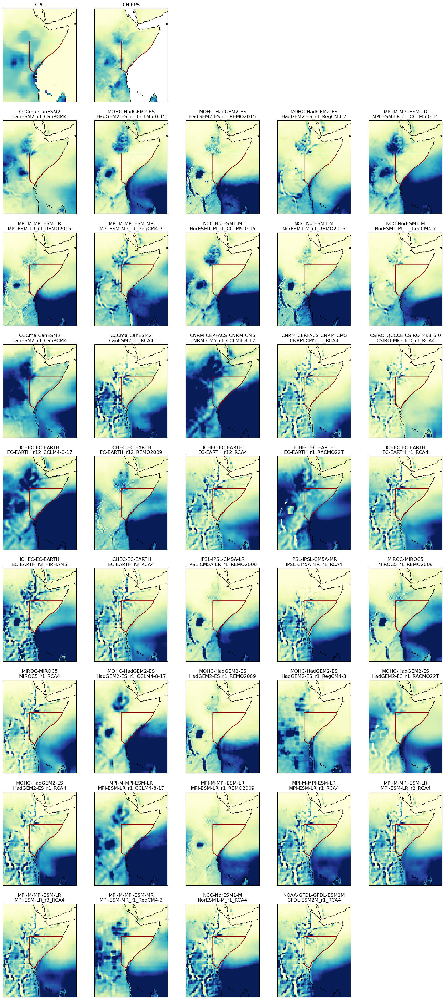

In [50]:
fl = sorted(glob.glob("cordex/sp-mam-pr_*.nc"))
nc = 5

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "YlGnBu", "vmin" : 0}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100,
                        subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (28,54,-15,18)})
# plt.subplots_adjust(wspace = 0.01)

# reference patterns from observations
cpc_mam.assign_attrs(long_name = "Precip").plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("CPC")
chirps_mam.assign_attrs(long_name = "Precip").plot(ax = axs[0,1], add_colorbar = False, **plot_kws) 
axs[0,1].set_title("CHIRPS")

# turn off remaining axes in top row
for ax in axs[0,:2]: 
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
for ax in axs[0,2:]: ax.set_axis_off()

# plot individual runs

for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sp = convert_units_to(xr.open_dataset(fnm).pr, "mm/month")
    pr_max = pr_sp.where(regionmask.mask_3D_geopandas(sf, pr_sp.lon, pr_sp.lat, drop = False).squeeze(drop = True) == 1).max()
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(pr_sp.lon, pr_sp.lat, pr_sp, **plot_kws, vmax = pr_max)
    ax.set_title(fnm.split("_")[2]+"\n"+cordex_model(fnm[14:]))
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
    
plt.savefig("fig/spatial_pr-mam_cordex.png")

##### **OND precip**

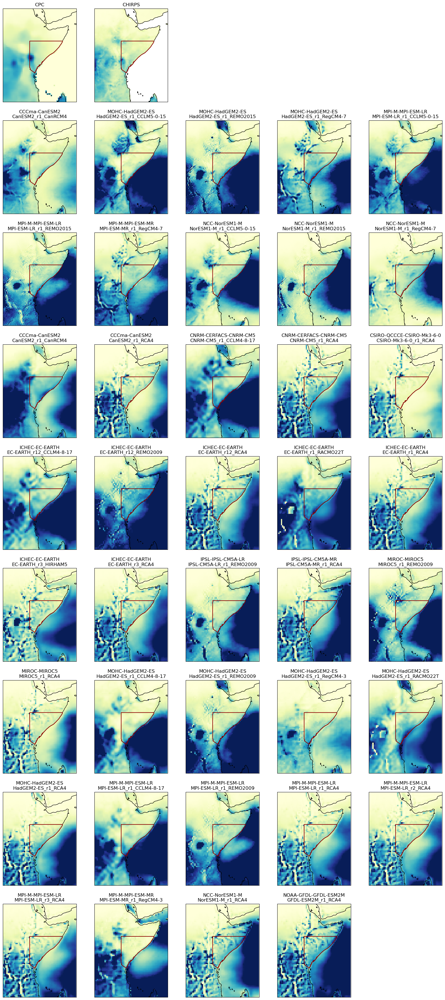

In [51]:
fl = sorted(glob.glob("cordex/sp-ond-pr_*.nc"))
nc = 5

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "YlGnBu"}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100,
                        subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (28,54,-15,18)})
# plt.subplots_adjust(wspace = 0.01)

# reference patterns from observations
cpc_ond.assign_attrs(long_name = "Precip").plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("CPC")
chirps_ond.assign_attrs(long_name = "Precip").plot(ax = axs[0,1], add_colorbar = False, **plot_kws) 
axs[0,1].set_title("CHIRPS")

# turn off remaining axes in top row
for ax in axs[0,:2]: 
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
for ax in axs[0,2:]: ax.set_axis_off()

# plot individual runs

for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sp = convert_units_to(xr.open_dataset(fnm).pr, "mm/month")
    pr_max = pr_sp.where(regionmask.mask_3D_geopandas(sf, pr_sp.lon, pr_sp.lat, drop = False).squeeze(drop = True) == 1).max()

    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(pr_sp.lon, pr_sp.lat, pr_sp, **plot_kws, vmax = pr_max)
    ax.set_title(fnm.split("_")[2]+"\n"+cordex_model(fnm[14:]))
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()

plt.savefig("fig/cordex_spatial_pr-ond.png")

##### **Annual temperatures**

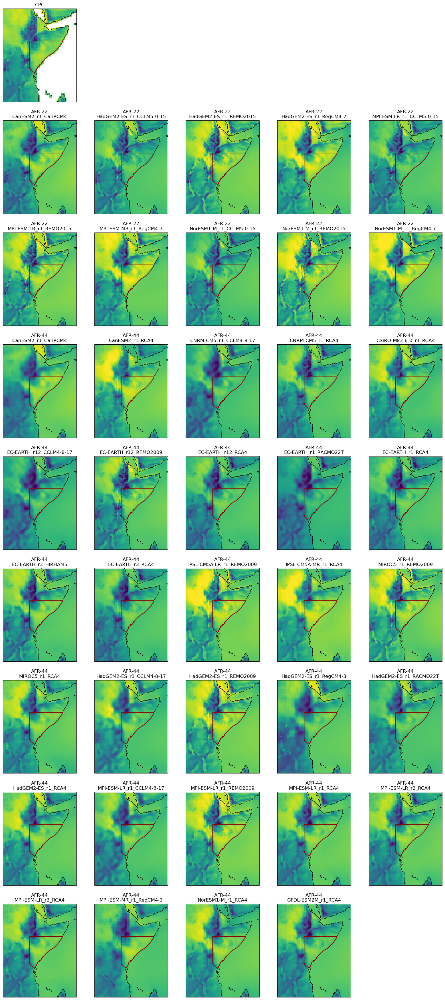

In [105]:
cpc_tas = xr.open_dataset("data/cpc_tas-spatial.nc").tas

fl = sorted(glob.glob("cordex/sp-tas_*.nc"))
nc = 5

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "viridis", "vmin" : 13, "vmax" : 31}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100,
                        subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (28,54,-15,18)})
# plt.subplots_adjust(wspace = 0.01)

# reference patterns from observations
cpc_tas.plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("CPC")
axs[0,0].coastlines()
sf.boundary.plot(ax = axs[0,0], color = "darkred")

# turn off remaining axes in top row
for ax in axs[0,1:]: ax.set_axis_off()

# plot individual runs

for i in range(len(fl)):
    
    fnm = fl[i]
    tas_sp = xr.open_dataset(fnm)
    if not "tas" in tas_sp.data_vars: continue
        
    tas_sp = tas_sp.tas
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(tas_sp.lon, tas_sp.lat, tas_sp, **plot_kws)
    ax.set_title(fnm.split("_")[1]+"\n"+cordex_model(fnm[10:]))
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
        
plt.savefig("fig/spatial_tas_cordex.png")

#### **Seasonal cycle**

In [30]:
cpc_pr = xr.open_dataset("data/cpc_pr_ts-daily.nc").precip.groupby("time.dayofyear").mean()

chirps_pr = xr.open_dataset("data/chirps_pr_ts-daily.nc").precip.groupby("time.dayofyear").mean()

def scale(ts): return((ts - ts.mean()) / ts.std())

from matplotlib.patches import Rectangle

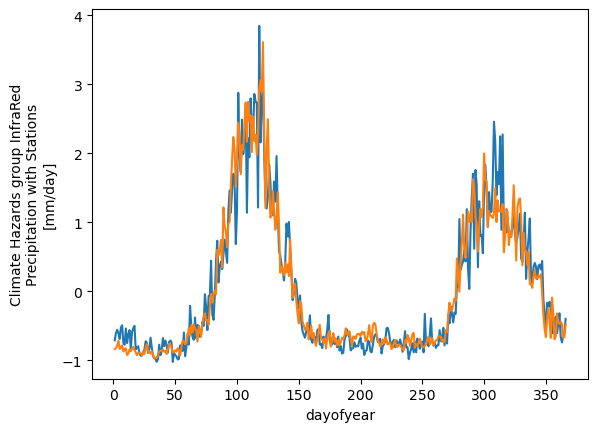

In [46]:
# chirps & CPC almost identical: will use CPC only from now on, to avoid cluttering plots
scale(cpc_pr).plot()
scale(chirps_pr).plot()

##### **Precip**


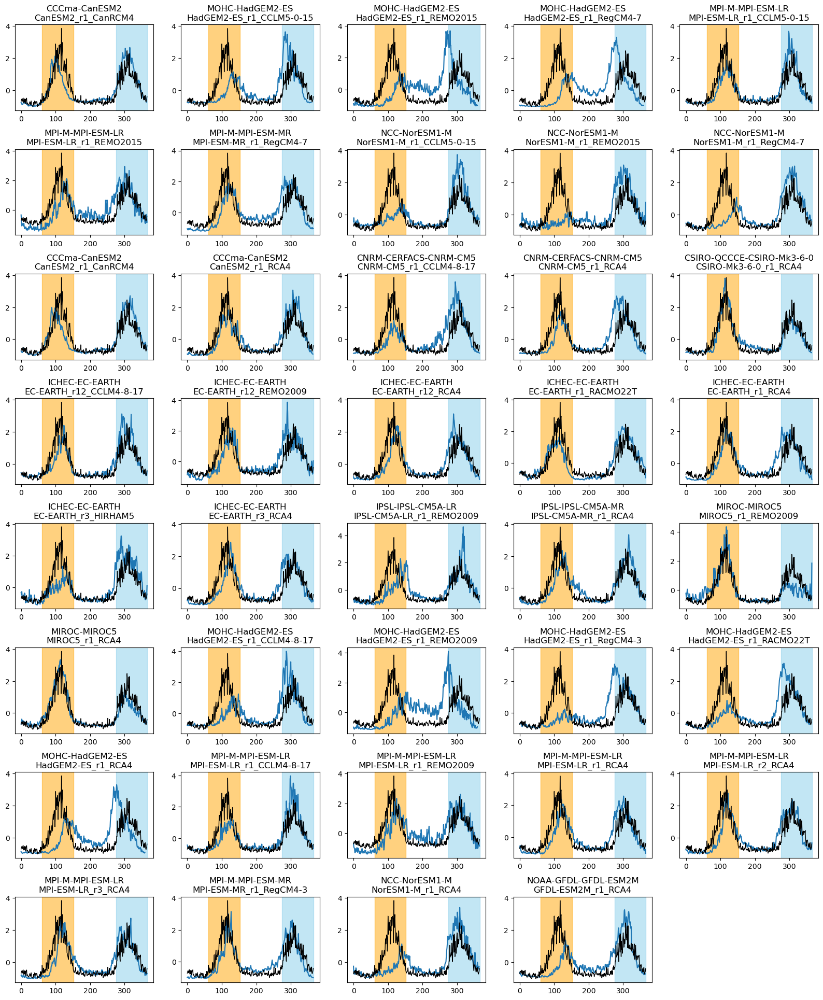

In [66]:
fl = sorted(glob.glob("cordex/sc-pr_*.nc"))

nc = 5

nr = int(np.ceil(len(fl) / nc))

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*3), dpi = 100)
plt.subplots_adjust(hspace = 0.45)

for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sc = xr.open_dataset(fl[i]).pr
    
    ax = fig.axes[i]
    ax.plot(scale(pr_sc))
    ax.plot(scale(cpc_pr), color = "k", lw = 1)
    ax.set_title(fnm.split("_")[2]+"\n"+cordex_model(fnm[11:]))
    
    # highlight the short & long rains thar we're interested in
    ylim = ax.get_ylim()
    ax.add_patch(Rectangle((datetime(2020,3,1).timetuple().tm_yday, -2), width = 91, height = 10, color = "orange", alpha = 0.5))
    ax.add_patch(Rectangle((datetime(2020,10,1).timetuple().tm_yday, -2), width = 91, height = 10, color = "skyblue", alpha = 0.5))
    ax.set_ylim(ylim)
    
if len(fl) < (nr * nc):
    for ax in fig.axes[len(fl):]: ax.set_axis_off()
    
plt.savefig("fig/cordex_seasonal_pr.png")

##### **Temperatures**


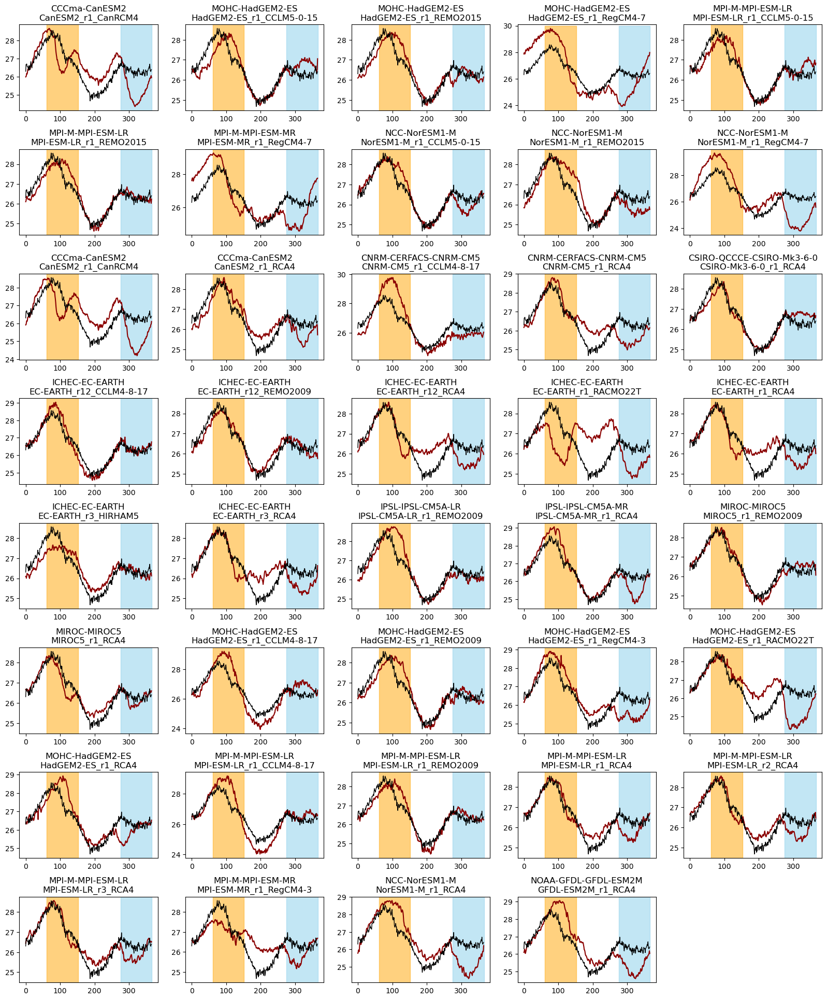

In [107]:
cpc_tas_sc = xr.open_dataset("data/cpc_tas_ts-daily.nc").tas.groupby("time.dayofyear").mean()

fl = sorted(glob.glob("cordex/sc-tas_*.nc"))
nc = 5
nr = int(np.ceil(len(fl) / nc))

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*3), dpi = 100)
plt.subplots_adjust(hspace = 0.45)

for i in range(len(fl)):
    
    fnm = fl[i]
    tas_sc= xr.open_dataset(fl[i]).tas
    
    ax = fig.axes[i]
    ax.plot(tas_sc - tas_sc.mean() + cpc_tas_sc.mean(), color = "darkred")     # shift to same level, since constant offset is irrelevant
    ax.plot(cpc_tas_sc, color = "k", lw = 1)
    ax.set_title(fnm.split("_")[2]+"\n"+cordex_model(fnm[11:]))
    
    # highlight the short & long rains that we're interested in
    ylim = ax.get_ylim()
    ax.add_patch(Rectangle((datetime(2020,3,1).timetuple().tm_yday, 20), width = 91, height = 10, color = "orange", alpha = 0.5))
    ax.add_patch(Rectangle((datetime(2020,10,1).timetuple().tm_yday, 20), width = 91, height = 10, color = "skyblue", alpha = 0.5))
    ax.set_ylim(ylim)
    
if len(fl) < (nr * nc):
    for ax in fig.axes[len(fl):]: ax.set_axis_off()
    
plt.savefig("fig/seasonal_tas_cordex.png")

### **HighResMIP**

#### **Spatial patterns**

In [220]:
chirps = decode_times(xr.open_dataset("data/centrends_chirps_28-54E_-15-18N.nc", decode_times = False)).precip.dropna("time", "all")
chirps = chirps.where(np.isnan(chirps).sum("time") == 0)

In [221]:
pr3_cpc = xr.open_dataset("data/cpc_pr_monthly.nc").precip.rolling(time = 3).mean().groupby("time.month")

cpc_mam, cpc_ond = [xr.open_dataset("data/cpc_pr-"+seas+"-spatial.nc").precip.mean("time") for seas in ["mam", "ond"]]
chirps_mam, chirps_ond = [chirps.rolling(time = 3).mean().sel(time = slice("1979", "2022")).groupby("time.month")[m].mean("time") for m in [5,12]]

##### **MAM precip**

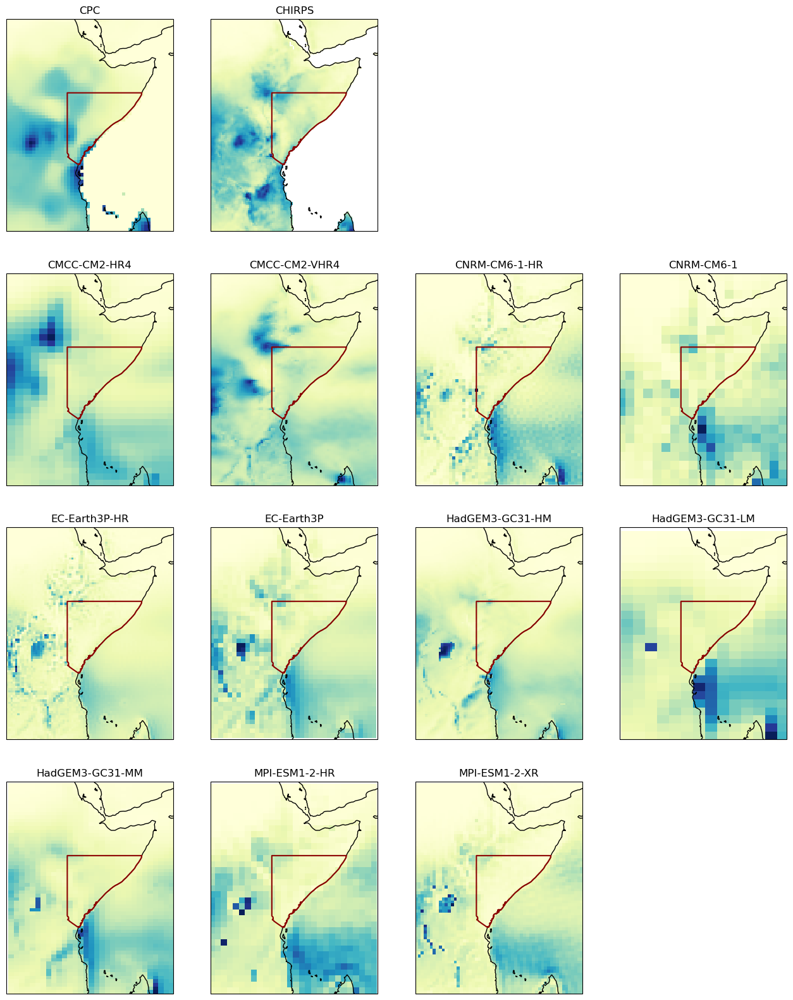

In [281]:
fl = sorted(glob.glob("highresmip/*pr*.nc"))
nc = 4

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "YlGnBu", "vmin" : 0}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100,
                        subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (28,54,-15,18)})
# plt.subplots_adjust(wspace = 0.01)

# reference patterns from observations
cpc_mam.assign_attrs(long_name = "Precip").plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("CPC")
chirps_mam.assign_attrs(long_name = "Precip").plot(ax = axs[0,1], add_colorbar = False, **plot_kws) 
axs[0,1].set_title("CHIRPS")

# turn off remaining axes in top row
for ax in axs[0,:2]: 
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
for ax in axs[0,2:]: ax.set_axis_off()

# plot individual runs
for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sp = convert_units_to(xr.open_dataset(fnm).pr, "mm/month").rolling(time = 3).sum().groupby("time.month")[5].sel(time = slice("1980", "2022")).mean("time")
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(pr_sp.lon, pr_sp.lat, pr_sp, **plot_kws)
    ax.set_title(fnm.split("_")[4])
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
    
plt.savefig("fig/spatial_pr-mam_highresmip.png")

##### **OND precip**

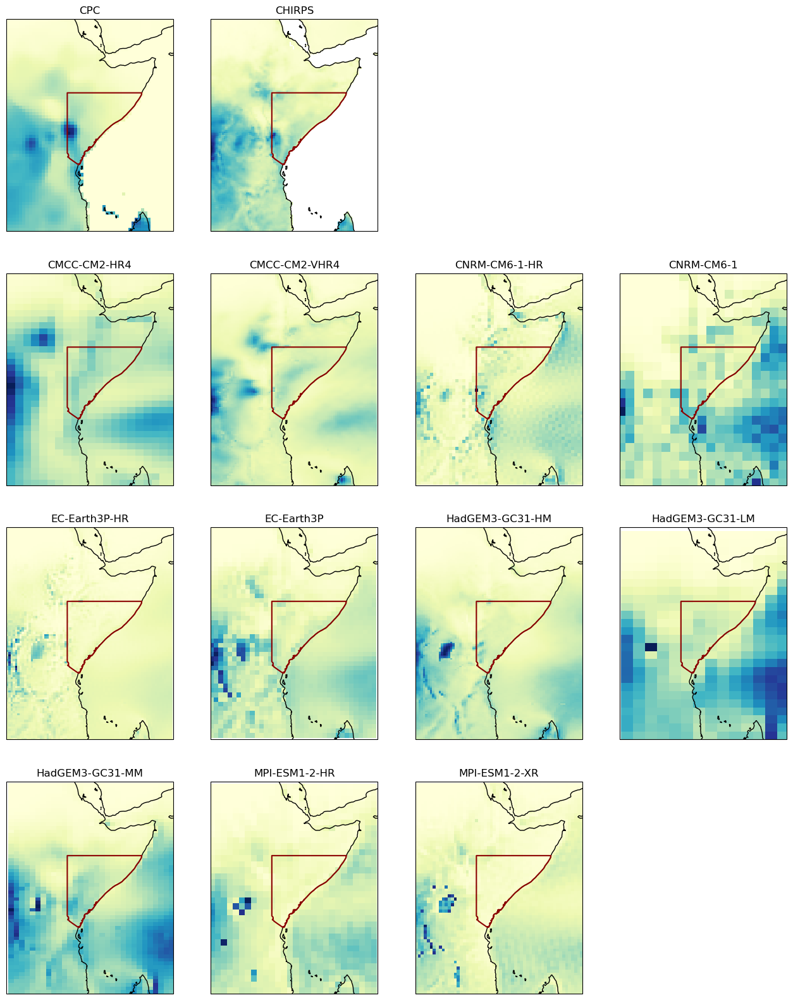

In [236]:
fl = sorted(glob.glob("highresmip/*pr*.nc"))
nc = 4

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "YlGnBu", "vmin" : 0}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100,
                        subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (28,54,-15,18)})
# plt.subplots_adjust(wspace = 0.01)

# reference patterns from observations
cpc_ond.assign_attrs(long_name = "Precip").plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("CPC")
chirps_ond.assign_attrs(long_name = "Precip").plot(ax = axs[0,1], add_colorbar = False, **plot_kws) 
axs[0,1].set_title("CHIRPS")

# turn off remaining axes in top row
for ax in axs[0,:2]: 
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
for ax in axs[0,2:]: ax.set_axis_off()

# plot individual runs
for i in range(len(fl)):
    
    fnm = fl[i]
    pr_sp = convert_units_to(xr.open_dataset(fnm).pr, "mm/month").rolling(time = 3).sum().groupby("time.month")[12].sel(time = slice("1980", "2022")).mean("time")
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(pr_sp.lon, pr_sp.lat, pr_sp, **plot_kws)
    ax.set_title(fnm.split("_")[4])
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
    
plt.savefig("fig/spatial_pr-ond_highresmip.png")

##### **Temperature**

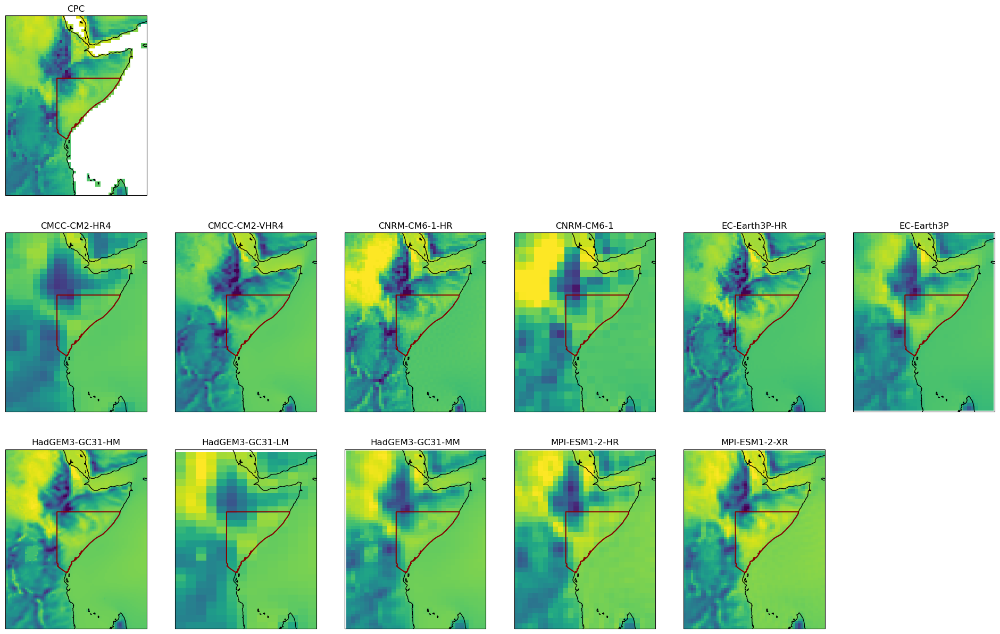

In [77]:
cpc_tas = xr.open_dataset("data/cpc_tas-spatial.nc").tas

fl = sorted(glob.glob("highresmip/*tas*.nc"))
nc = 6

nr = int(np.ceil(len(fl) / nc)+1)
plot_kws = {"cmap" : "viridis", "vmin" : 13, "vmax" : 31}

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*5), dpi = 100,
                        subplot_kw = {"projection" : cartopy.crs.PlateCarree(), "extent" : (28,54,-15,18)})
# plt.subplots_adjust(wspace = 0.01)

# reference patterns from observations
cpc_tas.plot(ax = axs[0,0], add_colorbar = False, **plot_kws)
axs[0,0].set_title("CPC")
axs[0,0].coastlines()
sf.boundary.plot(ax = axs[0,0], color = "darkred")

# turn off remaining axes in top row
for ax in axs[0,1:]: ax.set_axis_off()

# plot individual runs

for i in range(len(fl)):
    
    fnm = fl[i]
    tas_sp = convert_units_to(xr.open_dataset(fnm).tas, "degC").sel(time = slice("1980", "2022")).mean("time")
    
    ax = fig.axes[i+nc]
    cbar = ax.pcolormesh(tas_sp.lon, tas_sp.lat, tas_sp, **plot_kws)
    ax.set_title(fnm.split("_")[4])
    ax.coastlines()
    sf.boundary.plot(ax = ax, color = "darkred")
    
if len(fl) < ((nr-1) * nc):
    for ax in fig.axes[len(fl)+nc:]: ax.set_axis_off()
        
plt.savefig("fig/spatial_tas_highresmip.png")

#### **Seasonal cycle**

In [245]:
cpc_pr = xr.open_dataset("data/cpc_pr_ts-daily.nc").precip.groupby("time.dayofyear").mean()
def scale(ts): return((ts - ts.mean()) / ts.std())

from matplotlib.patches import Rectangle

##### **Precip**


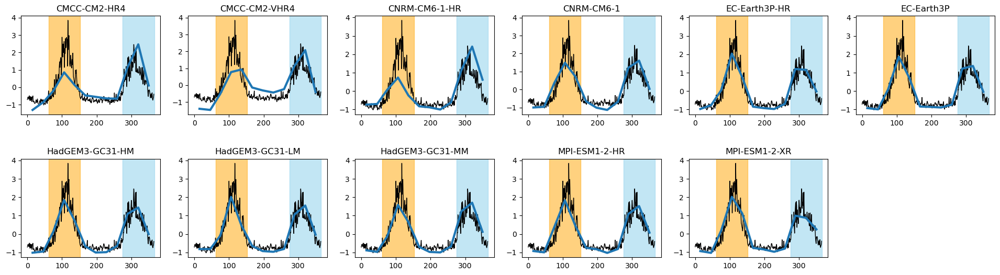

In [272]:
fl = sorted(glob.glob("highresmip/*pr*.nc"))
nc = 6
nr = int(np.ceil(len(fl) / nc))

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*3), dpi = 100)
plt.subplots_adjust(hspace = 0.45)

for i in range(len(fl)):
    
    fnm = fl[i]
    pr = xr.open_dataset(fnm).pr
    pr_sc = pr.where(regionmask.mask_3D_geopandas(sf, pr.lon, pr.lat, drop = False).squeeze(drop = True) == 1).mean(["lat", "lon"]).sel(time = slice("1980", "2022")).groupby("time.month").mean()
    pr_sc = pr_sc.assign_coords(month = [datetime(2020,int(m),15).timetuple().tm_yday for m in pr_sc.month]).rename(month = "doy")
    
    ax = fig.axes[i]
    ax.plot(pr_sc.doy, scale(pr_sc), lw = 3, zorder = 99)
    ax.plot(scale(cpc_pr), color = "k", lw = 1)
    ax.set_title(fnm.split("_")[4])
    
    # highlight the short & long rains thar we're interested in
    ylim = ax.get_ylim()
    ax.add_patch(Rectangle((datetime(2020,3,1).timetuple().tm_yday, -2), width = 91, height = 10, color = "orange", alpha = 0.5))
    ax.add_patch(Rectangle((datetime(2020,10,1).timetuple().tm_yday, -2), width = 91, height = 10, color = "skyblue", alpha = 0.5))
    ax.set_ylim(ylim)
    
if len(fl) < (nr * nc):
    for ax in fig.axes[len(fl):]: ax.set_axis_off()
    
plt.savefig("fig/seasonal_pr_highresmip.png")

##### **Temperature**


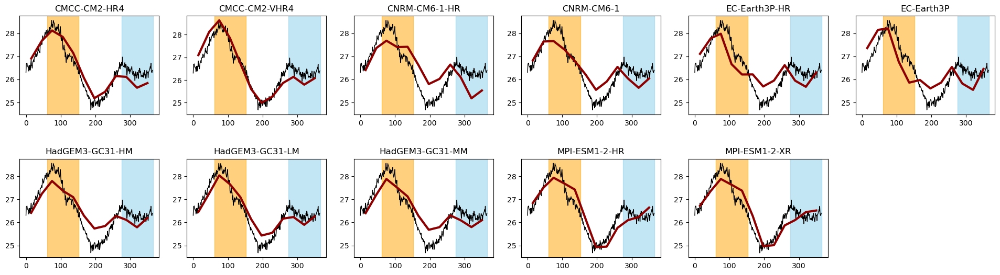

In [280]:
cpc_tas_sc = xr.open_dataset("data/cpc_tas_ts-daily.nc").tas.groupby("time.dayofyear").mean()
fl = sorted(glob.glob("highresmip/*tas*.nc"))
nc = 6
nr = int(np.ceil(len(fl) / nc))

fig, axs = plt.subplots(ncols = nc, nrows = nr, figsize = (nc*4,nr*3), dpi = 100)
plt.subplots_adjust(hspace = 0.45)

for i in range(len(fl)):
    
    fnm = fl[i]
    pr = convert_units_to(xr.open_dataset(fnm).tas, "degC")
    pr_sc = pr.where(regionmask.mask_3D_geopandas(sf, pr.lon, pr.lat, drop = False).squeeze(drop = True) == 1).mean(["lat", "lon"]).sel(time = slice("1980", "2022")).groupby("time.month").mean()
    pr_sc = pr_sc.assign_coords(month = [datetime(2020,int(m),15).timetuple().tm_yday for m in pr_sc.month]).rename(month = "doy")
    
    ax = fig.axes[i]
    ax.plot(pr_sc.doy, (pr_sc - pr_sc.mean()) + cpc_tas_sc.mean(), lw = 3, zorder = 99, color = "darkred")
    ax.plot(cpc_tas_sc, color = "k", lw = 1)
    ax.set_title(fnm.split("_")[4])
    
    # highlight the short & long rains thar we're interested in
    ylim = ax.get_ylim()
    ax.add_patch(Rectangle((datetime(2020,3,1).timetuple().tm_yday, 24), width = 91, height = 10, color = "orange", alpha = 0.5))
    ax.add_patch(Rectangle((datetime(2020,10,1).timetuple().tm_yday, 24), width = 91, height = 10, color = "skyblue", alpha = 0.5))
    ax.set_ylim(ylim)
    
if len(fl) < (nr * nc):
    for ax in fig.axes[len(fl):]: ax.set_axis_off()
    
plt.savefig("fig/seasonal_tas_highresmip.png")